In [2]:
# import packages
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None

import time
import gc

In [3]:
# read the data
start_time = time.time()
df = pd.read_csv('/Users/Subbalakshmi/Desktop/archive/movie_titles2.csv',header=None, engine='python') #Movie_titles.csv

print('Time taken:'+str((time.time() - start_time))+' seconds')  
del start_time

Time taken:0.09171795845031738 seconds


In [4]:
df

,0,1,2,3,4,5
0,1,2003.0,Dinosaur Planet,NaN,NaN,NaN
1,2,2004.0,Isle of Man TT 2004 Review,NaN,NaN,NaN
2,3,1997.0,Character,NaN,NaN,NaN
3,4,1994.0,Paula Abdul's Get Up & Dance,NaN,NaN,NaN
4,5,2004.0,The Rise and Fall of ECW,NaN,NaN,NaN
...,...,...,...,...,...,...
17765,17766,2002.0,Where the Wild Things Are and Other Maurice Se...,NaN,NaN,NaN
17766,17767,2004.0,Fidel Castro: American Experience,NaN,NaN,NaN
17767,17768,2000.0,Epoch,NaN,NaN,NaN
17768,17769,2003.0,The Company,NaN,NaN,NaN


In [5]:
df['Title'] = df[2].str.cat(df[[3,4,5]], sep='',na_rep='')
df.drop([2,3,4,5], axis=1, inplace=True)
df.rename(columns={0: "MovieID", 1: "YearOfRelease"},inplace=True) #Rename Column Names

In [6]:
df

,MovieID,YearOfRelease,Title
0,1,2003.0,Dinosaur Planet
1,2,2004.0,Isle of Man TT 2004 Review
2,3,1997.0,Character
3,4,1994.0,Paula Abdul's Get Up & Dance
4,5,2004.0,The Rise and Fall of ECW
...,...,...,...
17765,17766,2002.0,Where the Wild Things Are and Other Maurice Se...
17766,17767,2004.0,Fidel Castro: American Experience
17767,17768,2000.0,Epoch
17768,17769,2003.0,The Company


In [7]:

# select numeric columns
df_numeric = df.select_dtypes(include=[np.number])
numeric_cols = df_numeric.columns.values
print(numeric_cols)

['MovieID' 'YearOfRelease']


In [8]:

# select non numeric columns
df_non_numeric = df.select_dtypes(exclude=[np.number])
non_numeric_cols = df_non_numeric.columns.values
print(non_numeric_cols)

['Title']


<AxesSubplot:>

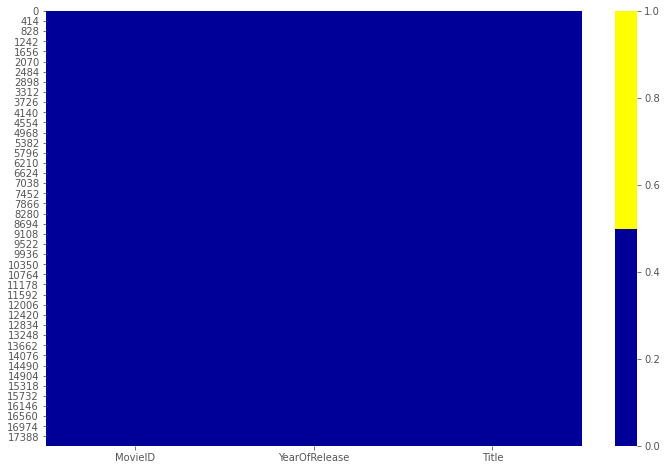

In [9]:
# Missing Data Heat Map
cols = df.columns[:10] # first 30 columns
colours = ['#000099', '#ffff00'] # specify the colours - yellow is missing. blue is not missing.
sns.heatmap(df[cols].isnull(), cmap=sns.color_palette(colours))

In [10]:
# if it's a larger dataset and the visualization takes too long can do this.
# % of missing.
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

MovieID - 0%
YearOfRelease - 0%
Title - 0%


In [ ]:
# first create missing indicator for features with missing data
for col in df.columns:
    missing = df[col].isnull()
    num_missing = np.sum(missing)
    
    if num_missing > 0:  
        print('created missing indicator for: {}'.format(col))
        df['{}_ismissing'.format(col)] = missing


# then based on the indicator, plot the histogram of missing values
ismissing_cols = [col for col in df.columns if 'ismissing' in col]
df['num_missing'] = df[ismissing_cols].sum(axis=1)

df['num_missing'].value_counts().reset_index().sort_values(by='index').plot.bar(x='index', y='num_missing')

<AxesSubplot:>

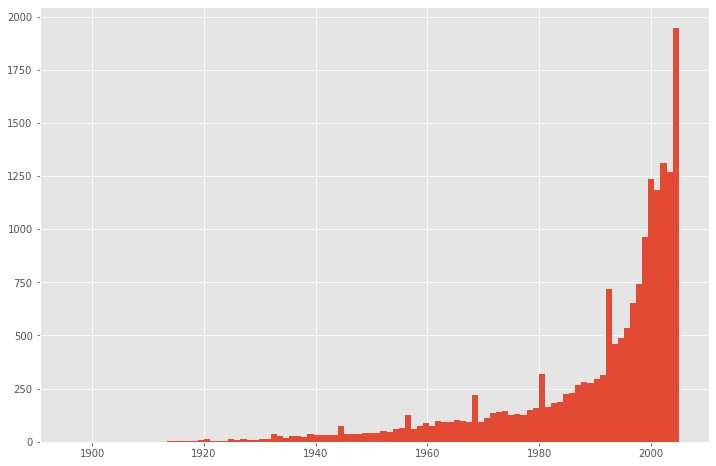

In [11]:
# histogram of a particular feature 'YearOfRelease'.
df['YearOfRelease'].hist(bins=100)

<AxesSubplot:>

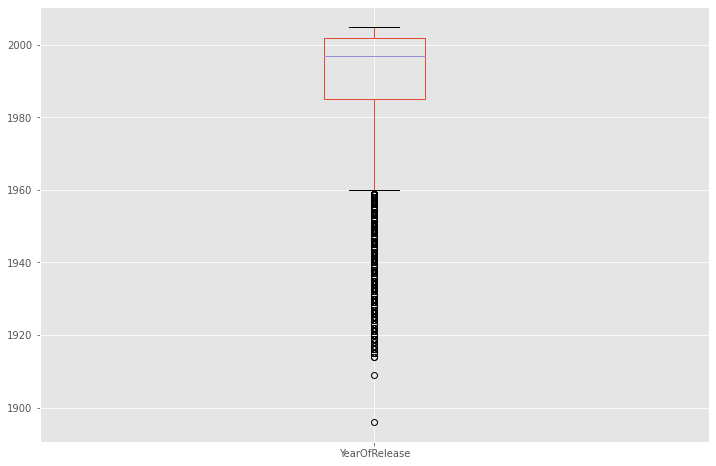

In [12]:
# box plot.
df.boxplot(column=['YearOfRelease'])

In [13]:
df['YearOfRelease'].describe()

count    17763.000000
mean      1990.263694
std         16.507891
min       1896.000000
25%       1985.000000
50%       1997.000000
75%       2002.000000
max       2005.000000
Name: YearOfRelease, dtype: float64